#Load Image

In [ ]:
!pip install opencv-python
!pip install opencv-python-headless numpy

In [ ]:
import os
import time
from PIL import Image
import cv2
import skimage.draw as drw
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance
os.environ["TFHUB_DOWNLOAD_PROGRESS"] = "True"

%matplotlib inline
import matplotlib
from google.colab.patches import cv2_imshow
import statistics

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/MyDrive/Nannofossils_Dataset(MASTER)"

In [ ]:
%cd /content/gdrive/MyDrive/Nannofossils_Dataset(MASTER)/train/images

/content/gdrive/MyDrive/Nannofossils_Dataset(MASTER)/train/images


In [ ]:
!ls

'image(100).jpg'  'image(142).jpg'  'image(184).jpg'  'image(225).jpg'	'image(61).jpg'
'image(101).jpg'  'image(143).jpg'  'image(185).jpg'  'image(226).jpg'	'image(62).jpg'
'image(102).jpg'  'image(144).jpg'  'image(186).jpg'  'image(227).jpg'	'image(63).jpg'
'image(103).jpg'  'image(145).jpg'  'image(187).jpg'  'image(22).jpg'	'image(64).jpg'
'image(104).jpg'  'image(146).jpg'  'image(188).jpg'  'image(23).jpg'	'image(65).jpg'
'image(105).jpg'  'image(147).jpg'  'image(189).jpg'  'image(24).jpg'	'image(66).jpg'
'image(106).jpg'  'image(148).jpg'  'image(18).jpg'   'image(25).jpg'	'image(67).jpg'
'image(107).jpg'  'image(149).jpg'  'image(190).jpg'  'image(26).jpg'	'image(68).jpg'
'image(108).jpg'  'image(14).jpg'   'image(191).jpg'  'image(27).jpg'	'image(69).jpg'
'image(109).jpg'  'image(150).jpg'  'image(192).jpg'  'image(28).jpg'	'image(6).jpg'
'image(10).jpg'   'image(151).jpg'  'image(193).jpg'  'image(29).jpg'	'image(70).jpg'
'image(110).jpg'  'image(152).jpg'  'image(194).jpg'

In [ ]:
# Membuat variabel yang berbeda pada setiap iterasi
ori_varString = []
for i in range(227):
  img_bgr = "image("+ str(i+1) +").jpg"
  globals()[f"image_ori{i+1}"] = cv2.imread(img_bgr)
  ori_varString.append("image_ori"+str(i+1))
# Mengubah setiap string menjadi array
ori_var = [eval(string) for string in ori_varString]

In [ ]:
def show_images(images_var,title):
    num_rows = 2
    num_cols = 4
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(14, 8))
    fig.suptitle(title)

    for i, ax in enumerate(axes.flat):
        ax.imshow(images_var[i])
        ax.set_title(f"Image {i+1}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
# Membuat variabel yang berbeda pada setiap iterasi
ori_rgb_varString = []
for i in range(227):
  img_rgb = ori_var[i]
  globals()[f"image_ori_rgb{i+1}"] = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB)
  ori_rgb_varString.append("image_ori_rgb"+str(i+1))
# Mengubah setiap string menjadi array
ori_rgb_var = [eval(string) for string in ori_rgb_varString]

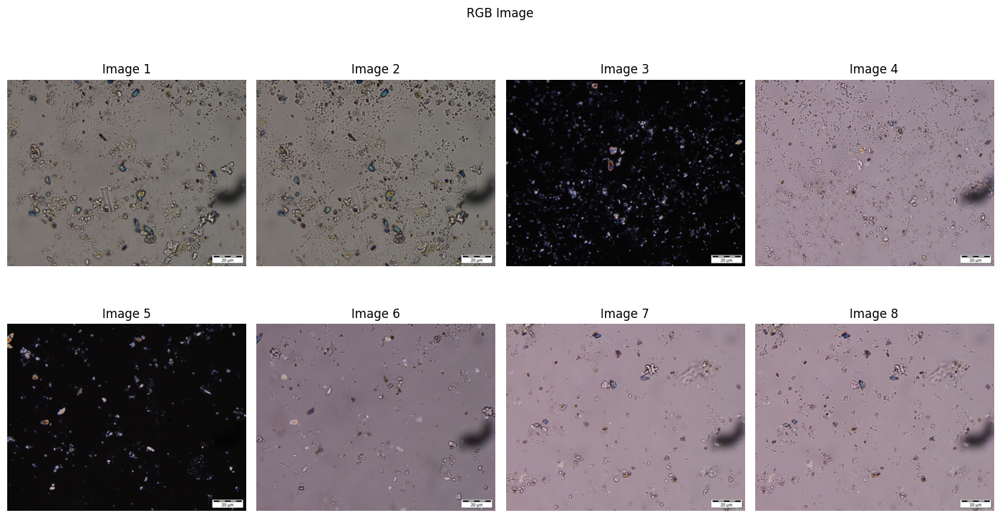

In [ ]:
show_images(ori_rgb_var, "RGB Image")

In [ ]:
import os
import time
from PIL import Image
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
os.environ["TFHUB_DOWNLOAD_PROGRESS"] = "True"

#HSRGAN

In [ ]:
def preprocess_image(image_path):
  """ Loads image from path and preprocesses to make it model ready
      Args:
        image_path: Path to the image file
  """
  hr_image = tf.image.decode_image(tf.io.read_file(image_path))
  # If PNG, remove the alpha channel. The model only supports
  # images with 3 color channels.
  if hr_image.shape[-1] == 4:
    hr_image = hr_image[...,:-1]
  hr_size = (tf.convert_to_tensor(hr_image.shape[:-1]) // 4) * 4
  hr_image = tf.image.crop_to_bounding_box(hr_image, 0, 0, hr_size[0], hr_size[1])
  hr_image = tf.cast(hr_image, tf.float32)
  return tf.expand_dims(hr_image, 0)

def save_image(image, filename):
  """
    Saves unscaled Tensor Images.
    Args:
      image: 3D image tensor. [height, width, channels]
      filename: Name of the file to save.
  """
  if not isinstance(image, Image.Image):
    image = tf.clip_by_value(image, 0, 255)
    image = Image.fromarray(tf.cast(image, tf.uint8).numpy())
  image.save("%s.jpg" % filename)
  print("Saved as %s.jpg" % filename)

In [ ]:
# Defining helper functions
def downscale_image(image):
  """
      Scales down images using bicubic downsampling.
      Args:
          image: 3D or 4D tensor of preprocessed image
  """
  image_size = []
  if len(image.shape) == 3:
    image_size = [image.shape[1], image.shape[0]]
  else:
    raise ValueError("Dimension mismatch. Can work only on single image.")

  image = tf.squeeze(
      tf.cast(
          tf.clip_by_value(image, 0, 255), tf.uint8))

  lr_image = np.asarray(
    Image.fromarray(image.numpy())
    .resize([image_size[0] // 4, image_size[1] // 4],
              Image.BICUBIC))

  lr_image = tf.expand_dims(lr_image, 0)
  lr_image = tf.cast(lr_image, tf.float32)
  return lr_image

In [ ]:
SAVED_MODEL_PATH = "https://tfhub.dev/captain-pool/esrgan-tf2/1"
model = hub.load(SAVED_MODEL_PATH)

Downloaded https://tfhub.dev/captain-pool/esrgan-tf2/1, Total size: 20.60MB



In [ ]:
def low2highImg(image, modelTrain = model):
  h_res_img = preprocess_image(image)
  low_res_img = downscale_image(tf.squeeze(h_res_img))
  high_res_img = modelTrain(low_res_img)
  high_res_img = tf.squeeze(high_res_img)
  return high_res_img

In [ ]:
# Membuat variabel yang berbeda pada setiap iterasi
ori2_varString = []
for i in range(227):
  img_bgr = "image("+ str(i+1) +").jpg"
  globals()[f"image_ori2{i+1}"] = img_bgr
  ori2_varString.append("image_ori2"+str(i+1))
# Mengubah setiap string menjadi array
ori2_var = [eval(string) for string in ori2_varString]

In [ ]:
# Membuat variabel yang berbeda pada setiap iterasi
ori_high_res_varString = []
for i in range(227):
  img_ori = ori2_var[i]
  globals()[f"highResImg{i+1}"] = low2highImg(img_ori)
  ori_high_res_varString.append("highResImg"+str(i+1))
# Mengubah setiap string menjadi array
ori_high_res_var = [eval(string) for string in ori_high_res_varString]

In [ ]:
def show_images2(images_var,title):
    num_rows = 2
    num_cols = 4
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(14, 8))
    fig.suptitle(title)

    for i, ax in enumerate(axes.flat):
        image = images_var[i]
        image = tf.clip_by_value(image, 0, 255)
        image = Image.fromarray(tf.cast(image, tf.uint8).numpy())
        ax.imshow(image)
        ax.set_title(f"Image {i+1}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

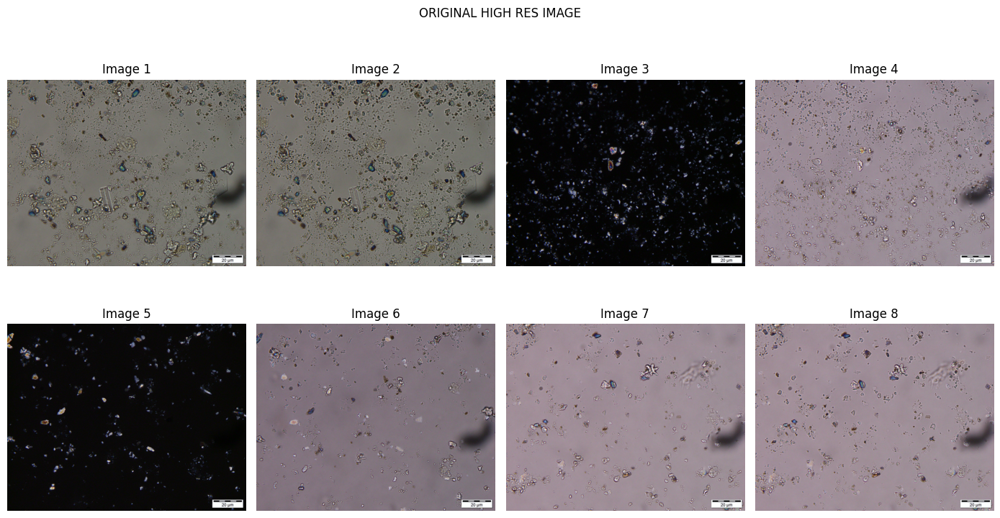

In [ ]:
show_images2(ori_high_res_var, "ORIGINAL HIGH RES IMAGE")

In [ ]:
from PIL import Image
from numpy import asarray
output_HRes = "/content/gdrive/MyDrive/Nannofossils_Dataset(MASTER)/preprocessed_image/HRes/"
for i in range(227):
  image_high_res = ori_high_res_var[i]
  numpydata = asarray(image_high_res)
  image_high_res2 = cv2.cvtColor(numpydata, cv2.COLOR_BGR2RGB)
  cv2.imwrite(f"{output_HRes}image_HRes({str(i+1)}).jpg",image_high_res2)

#Invert Image

In [ ]:
def invert_image(img, plot_hist=False):
    # Invert the image
    inverted_img = 255 - img

    if plot_hist:
        for i in range(inverted_img.shape[2]):
            plt.hist(inverted_img[:, :, i].ravel(), bins=256, alpha=0.5, label=f'Channel {i}')
        plt.title('Histogram of Inverted Image')
        plt.legend()
        plt.show()

    return inverted_img

In [ ]:
path_HRes = "/content/gdrive/MyDrive/Nannofossils_Dataset(MASTER)/preprocessed_image/HRes/"
HRes_ori_varString = []
for i in range(227):
  HRes_img_bgr = (path_HRes+"image_HRes(" + str(i+1) + ").jpg")
  globals()[f"high_res_img{i+1}"] = cv2.imread(HRes_img_bgr)
  HRes_ori_varString.append("high_res_img"+str(i+1))
# Mengubah setiap string menjadi array
HRes_ori_var = [eval(string) for string in HRes_ori_varString]

In [ ]:
Hres_varString = []
for i in range(227):
  Hres_img_rgb = HRes_ori_var[i]
  globals()[f"image_Hres_ori_rgb{i+1}"] = cv2.cvtColor(Hres_img_rgb, cv2.COLOR_BGR2RGB)
  Hres_varString.append("image_Hres_ori_rgb"+str(i+1))
# Mengubah setiap string menjadi array
Hres_ori_rgb_var = [eval(string) for string in Hres_varString]

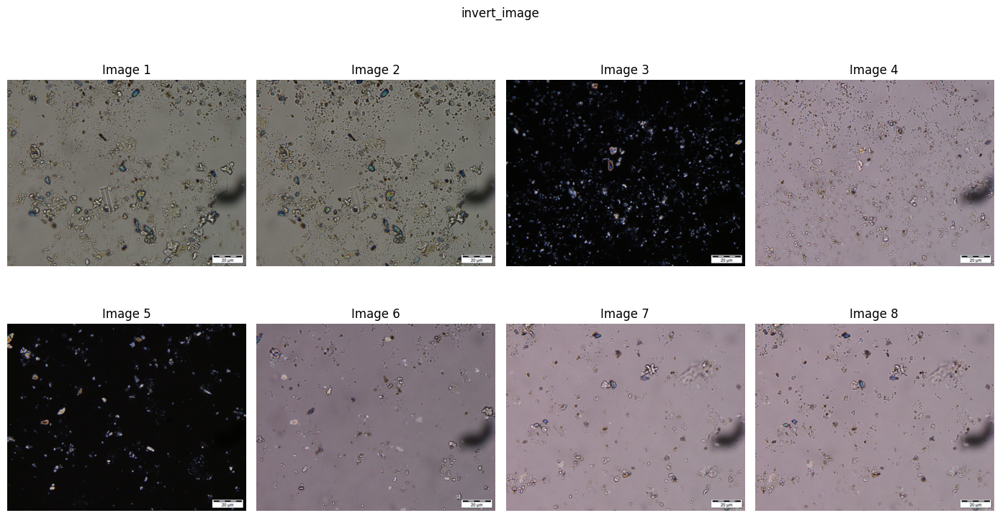

In [ ]:
show_images(Hres_ori_rgb_var,"invert_image")

In [ ]:
# Membuat variabel yang berbeda pada setiap iterasi
invert_image_varString = []
for i in range(227):
  Hres = Hres_ori_rgb_var[i]
  globals()[f"invert_image_Img{i+1}"] = invert_image(Hres)
  invert_image_varString.append("invert_image_Img"+str(i+1))
# Mengubah setiap string menjadi array
invert_image_var = [eval(string) for string in invert_image_varString]

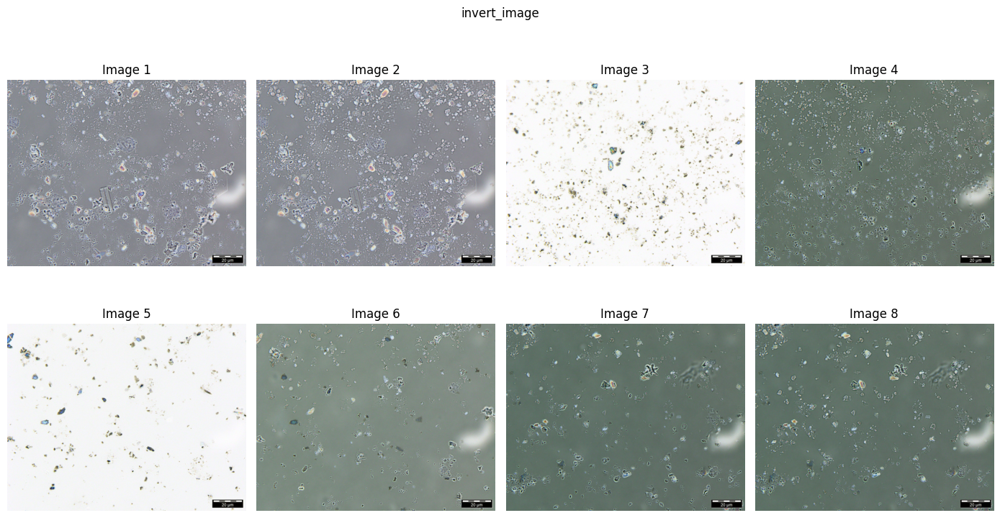

In [ ]:
show_images(invert_image_var,"invert_image")

#MeanSTD Contrast Stratching

In [ ]:
def stretch(img,sigma =3,plot_hist=False):
    stretched = np.zeros(img.shape)
    for i in range(img.shape[2]):  #looping through the bands
        band = img[:,:,i] # copiying each band into the variable `band`
        if np.min(band)<0: # if the min is less that zero, first we add min to all pixels so min becomes 0
            band = band + np.abs(np.min(band))
        band = band / np.max(band)
        band = band * 255 # convertaning values to 0-255 range
        if plot_hist:
            plt.hist(band.ravel(), bins=256) #calculating histogram
            plt.show()
        # plt.imshow(band)
        # plt.show()
        std = np.std(band)
        mean = np.mean(band)
        max = mean+(sigma*std)
        min = mean-(sigma*std)
        band = (band-min)/(max-min)
        band = band * 255
        # this streching cuases the values less than `mean-simga*std` to become negative
        # and values greater than `mean+simga*std` to become more than 255
        # so we clip the values ls 0 and gt 255
        band[band>255]=255
        band[band<0]=0
        print('band',i,np.min(band),np.mean(band),np.std(band),np.max(band))
        if plot_hist:
            plt.hist(band.ravel(), bins=256) #calculating histogram
            plt.show()
        stretched[:,:,i] = band
    stretched = stretched.astype('int')
    return stretched

##Proposed Method

In [ ]:
# Fungsi untuk menentukan apakah citra dominan gelap atau terang
def adaptiveInvertContrastStratching(image):
    # Menghitung rata-rata pixel
    average_pixel_value = np.mean(image)

    # Menentukan dominasi gelap atau terang
    if average_pixel_value < 90:
        img_rgb = image
        invert_image_Img = invert_image(img_rgb)
        result = stretch(invert_image_Img)
    else:
        result = stretch(image)

    return result


In [ ]:
# Membuat variabel yang berbeda pada setiap iterasi
adaptiveInvertContrast_varString = []
for i in range(227):
  Hres = Hres_ori_rgb_var[i]
  globals()[f"adaptiveInvertContrast_Img{i+1}"] = adaptiveInvertContrastStratching(Hres)
  adaptiveInvertContrast_varString.append("adaptiveInvertContrast_Img"+str(i+1))
# Mengubah setiap string menjadi array
adaptiveInvertContrast_var = [eval(string) for string in adaptiveInvertContrast_varString]

band 0 0.0 127.23486623683326 38.72820822281002 255.0
band 1 0.0 127.12037890026907 39.00946456117307 255.0
band 2 0.0 127.00819228481025 38.74564439360846 255.0
band 0 0.0 127.2646873441067 39.95614563662954 255.0
band 1 0.0 127.19180255533705 40.09387197649324 255.0
band 2 0.0 127.07478576829895 39.91324867059844 255.0
band 0 0.0 129.9306479102669 25.79977681486475 146.9921903473944
band 1 0.0 129.92256887519096 26.48008476079291 147.1840741114458
band 2 0.0 129.74513490256476 29.611443493889638 147.35200109096436
band 0 0.0 128.05512065515924 37.71891090895359 255.0
band 1 0.0 127.65487013562664 38.15032650443684 255.0
band 2 0.0 127.91311358916933 38.2743475591937 255.0
band 0 0.0 130.1682909237286 21.774932322785823 153.77109387594584
band 1 0.0 130.17418813063546 21.851727355908412 152.29742453677335
band 2 0.0 130.12013623222077 24.155102504440954 150.54065975364543
band 0 0.0 127.59107519224513 32.23466399387309 255.0
band 1 0.0 127.08112122150331 31.85510666811927 255.0
band 2

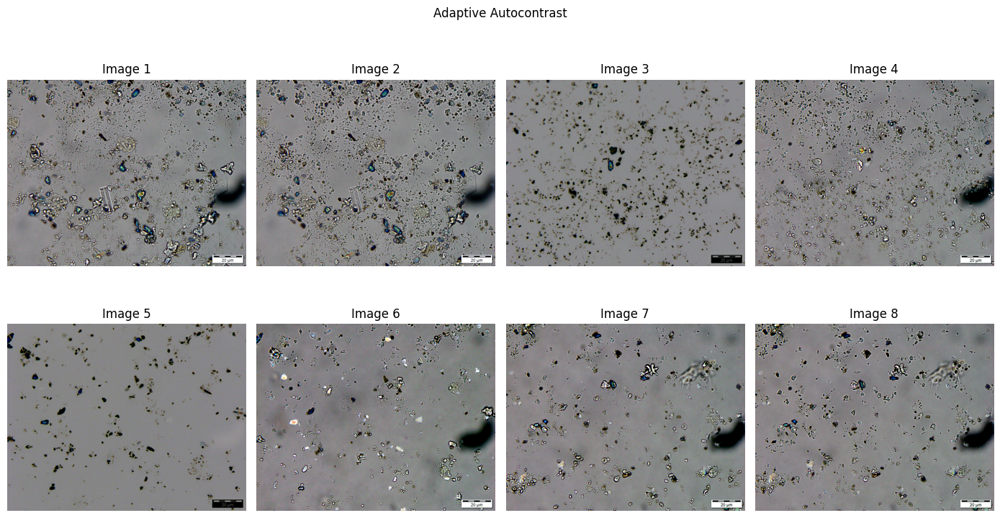

In [ ]:
show_images(adaptiveInvertContrast_var,"Adaptive Autocontrast")

##Save Image Purpose Method

In [ ]:
from PIL import Image
from numpy import asarray
output_MeanSTD_purposed = "/content/gdrive/MyDrive/Nannofossils_Dataset(MASTER)/preprocessed_image/MeanSTD_purposed/"
for i in range(227):
  image_MeanSTD_purposed = adaptiveInvertContrast_var[i]
  numpydata = asarray(image_MeanSTD_purposed)
  numpydata = numpydata.astype(np.uint8)
  image_MeanSTD_purposed2 = cv2.cvtColor(numpydata, cv2.COLOR_BGR2RGB)
  cv2.imwrite(f"{output_MeanSTD_purposed}image_MeanSTD_purposed({str(i+1)}).jpg",image_MeanSTD_purposed2)

##Mean STD Ori

In [ ]:
# Membuat variabel yang berbeda pada setiap iterasi
autocontrast_varString = []
for i in range(227):
  Hres = Hres_ori_rgb_var[i]
  globals()[f"autocontrast_Img{i+1}"] = stretch(Hres)
  autocontrast_varString.append("autocontrast_Img"+str(i+1))
# Mengubah setiap string menjadi array
autocontrast_var = [eval(string) for string in autocontrast_varString]

band 0 0.0 127.23486623683326 38.72820822281002 255.0
band 1 0.0 127.12037890026907 39.00946456117307 255.0
band 2 0.0 127.00819228481025 38.74564439360846 255.0
band 0 0.0 127.2646873441067 39.95614563662954 255.0
band 1 0.0 127.19180255533705 40.09387197649324 255.0
band 2 0.0 127.07478576829895 39.91324867059844 255.0
band 0 108.00780965260562 125.06935208973303 25.799776814864742 255.0
band 1 107.8159258885542 125.07743112480902 26.48008476079291 255.0
band 2 107.64799890903562 125.25486509743526 29.611443493889645 255.0
band 0 0.0 128.05512065515924 37.71891090895359 255.0
band 1 0.0 127.65487013562664 38.15032650443684 255.0
band 2 0.0 127.91311358916933 38.2743475591937 255.0
band 0 101.22890612405418 124.83170907627152 21.774932322785823 255.0
band 1 102.70257546322664 124.82581186936453 21.851727355908412 255.0
band 2 104.45934024635456 124.87986376777927 24.155102504440954 255.0
band 0 0.0 127.59107519224513 32.23466399387309 255.0
band 1 0.0 127.08112122150331 31.85510666811

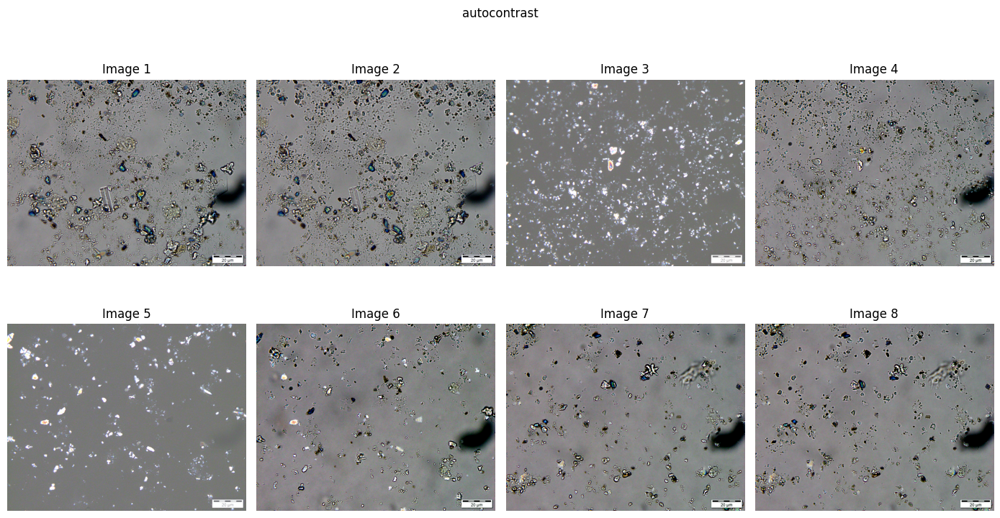

In [ ]:
show_images(autocontrast_var,"autocontrast")

In [ ]:
from PIL import Image
from numpy import asarray
output_MeanSTD_ori = "/content/gdrive/MyDrive/Nannofossils_Dataset(MASTER)/preprocessed_image/MeanSTD_ori/"
for i in range(227):
  image_MeanSTD_ori = autocontrast_var[i]
  numpydata = asarray(image_MeanSTD_ori)
  numpydata = numpydata.astype(np.uint8)
  image_MeanSTD_ori2 = cv2.cvtColor(numpydata, cv2.COLOR_BGR2RGB)
  cv2.imwrite(f"{output_MeanSTD_ori}image_MeanSTD_ori({str(i+1)}).jpg",image_MeanSTD_ori2)

#BCET

In [ ]:
def bcet(img, plot_hist=False):
    # Convert the image to float32 for precision
    img = img.astype(np.float32)

    # Compute the global minimum, maximum, mean, and standard deviation
    I_min = np.min(img)
    I_max = np.max(img)
    I_mean = np.mean(img)
    I_std = np.std(img)

    # Desired minimum, maximum, and mean values
    O_min = 0
    O_max = 255
    O_mean = (O_max + O_min) / 2

    # BCET formula
    stretched = ((img - I_mean) * (O_max - O_min) / (I_max - I_min)) + O_mean

    # Clip values to the range [0, 255]
    stretched = np.clip(stretched, O_min, O_max)

    # Convert back to uint8
    stretched = stretched.astype(np.uint8)

    if plot_hist:
        plt.figure(figsize=(12, 6))

        # Original image histogram
        plt.subplot(1, 2, 1)
        plt.hist(img.ravel(), bins=256, color='blue', alpha=0.5, label='Original')
        plt.title('Original Image Histogram')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')
        plt.legend()

        # Enhanced image histogram
        plt.subplot(1, 2, 2)
        plt.hist(stretched.ravel(), bins=256, color='red', alpha=0.5, label='Enhanced')
        plt.title('Enhanced Image Histogram')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')
        plt.legend()

        plt.show()

    return stretched

In [ ]:
# Membuat variabel yang berbeda pada setiap iterasi
bcet_varString = []
for i in range(227):
  Hres = Hres_ori_rgb_var[i]
  globals()[f"bcet_Img{i+1}"] = bcet(Hres)
  bcet_varString.append("bcet_Img"+str(i+1))
# Mengubah setiap string menjadi array
bcet_var = [eval(string) for string in bcet_varString]

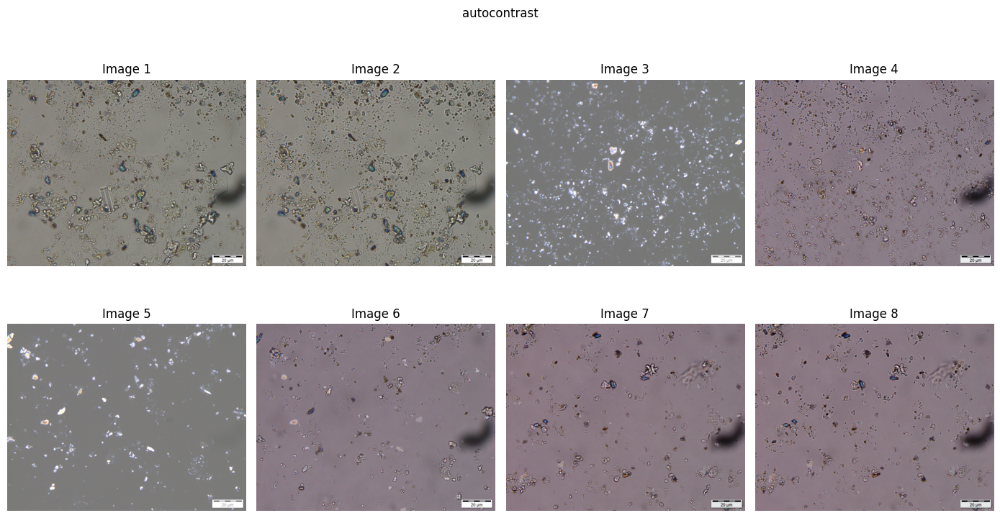

In [ ]:
show_images(bcet_var,"autocontrast")

In [ ]:
from PIL import Image
from numpy import asarray
output_bcet = "/content/gdrive/MyDrive/Nannofossils_Dataset(MASTER)/preprocessed_image/BCET/"
for i in range(227):
  image_bcet = bcet_var[i]
  numpydata = asarray(image_bcet)
  numpydata = numpydata.astype(np.uint8)
  image_bcet = cv2.cvtColor(numpydata, cv2.COLOR_BGR2RGB)
  cv2.imwrite(f"{output_bcet}image_bcet({str(i+1)}).jpg",image_bcet)

#HE

In [ ]:
def apply_HE(image):
  ycrcb = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
  clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
  ycrcb[:, :, 0] = clahe.apply(ycrcb[:, :, 0])
  equalized_image = cv2.cvtColor(ycrcb, cv2.COLOR_YCrCb2BGR)
  return equalized_image

In [ ]:
# Membuat variabel yang berbeda pada setiap iterasi
he_varString = []
for i in range(227):
  Hres = Hres_ori_rgb_var[i]
  globals()[f"he_Img{i+1}"] = apply_HE(Hres)
  he_varString.append("he_Img"+str(i+1))
# Mengubah setiap string menjadi array
he_var = [eval(string) for string in he_varString]

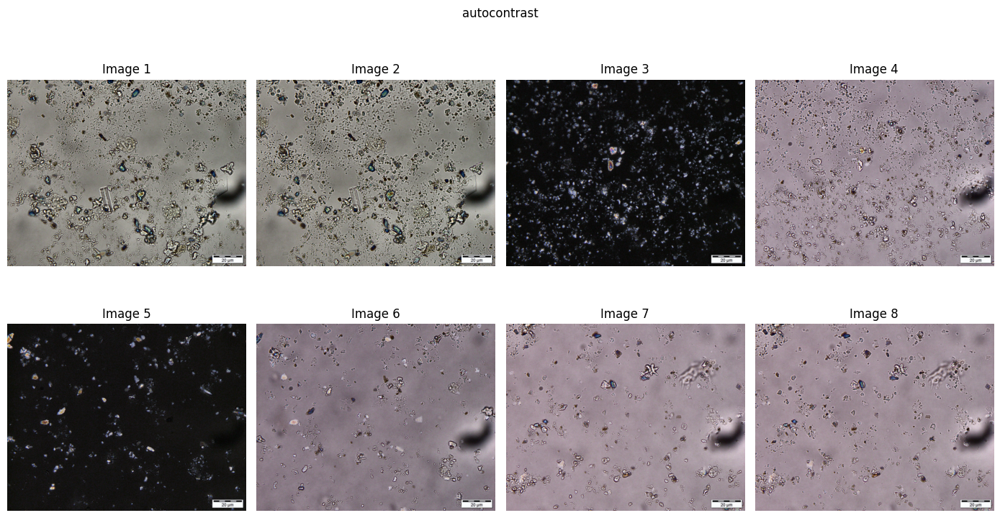

In [ ]:
show_images(he_var,"autocontrast")

In [ ]:
from PIL import Image
from numpy import asarray
output_HE = "/content/gdrive/MyDrive/Nannofossils_Dataset(MASTER)/preprocessed_image/HE/"
for i in range(227):
  image_HE = he_var[i]
  numpydata = asarray(image_HE)
  numpydata = numpydata.astype(np.uint8)
  image_HE2 = cv2.cvtColor(numpydata, cv2.COLOR_BGR2RGB)
  cv2.imwrite(f"{output_HE}image_HE({str(i+1)}).jpg",image_HE2)

#CLAHE

In [ ]:
def apply_CLAHE(image):
    # Convert the image to grayscale
    ycrcb = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)

    # Create a CLAHE object
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    ycrcb[:, :, 0] = clahe.apply(ycrcb[:, :, 0])
    # Apply CLAHE to the grayscale image
    equalized_image = cv2.cvtColor(ycrcb, cv2.COLOR_YCrCb2BGR)

    return equalized_image

In [ ]:
# Membuat variabel yang berbeda pada setiap iterasi
clahe_varString = []
for i in range(227):
  Hres = Hres_ori_rgb_var[i]
  globals()[f"clahe_Img{i+1}"] = apply_CLAHE(Hres)
  clahe_varString.append("clahe_Img"+str(i+1))
# Mengubah setiap string menjadi array
clahe_var = [eval(string) for string in clahe_varString]

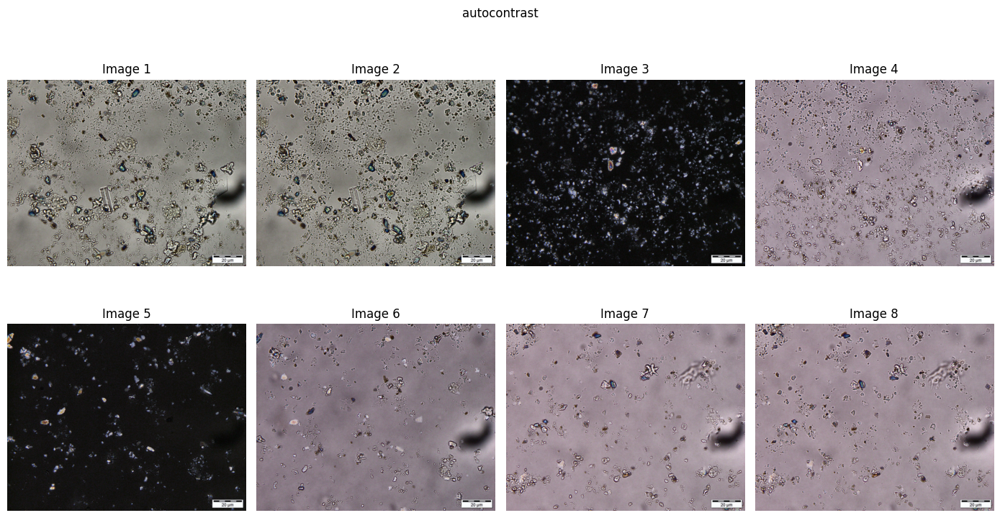

In [ ]:
show_images(clahe_var,"autocontrast")

In [ ]:
from PIL import Image
from numpy import asarray
output_CLAHE = "/content/gdrive/MyDrive/Nannofossils_Dataset(MASTER)/preprocessed_image/CLAHE/"
for i in range(227):
  image_CLAHE = clahe_var[i]
  numpydata = asarray(image_CLAHE)
  numpydata = numpydata.astype(np.uint8)
  image_CLAHE2 = cv2.cvtColor(numpydata, cv2.COLOR_BGR2RGB)
  cv2.imwrite(f"{output_CLAHE}image_CLAHE({str(i+1)}).jpg",image_CLAHE2)

#AHE

In [ ]:
from skimage import exposure

In [ ]:
def apply_AHE(image):
  ycrcb = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
  y_channel = ycrcb[:, :, 0]
  y_channel_eq = exposure.equalize_adapthist(y_channel, clip_limit=0.03)
  ycrcb[:, :, 0] = (y_channel_eq * 255).astype(np.uint8)
  equalized_image = cv2.cvtColor(ycrcb, cv2.COLOR_YCrCb2BGR)
  return equalized_image

In [ ]:
# Membuat variabel yang berbeda pada setiap iterasi
ahe_varString = []
for i in range(227):
  Hres = Hres_ori_rgb_var[i]
  globals()[f"ahe_Img{i+1}"] = apply_AHE(Hres)
  ahe_varString.append("ahe_Img"+str(i+1))
# Mengubah setiap string menjadi array
ahe_var = [eval(string) for string in ahe_varString]

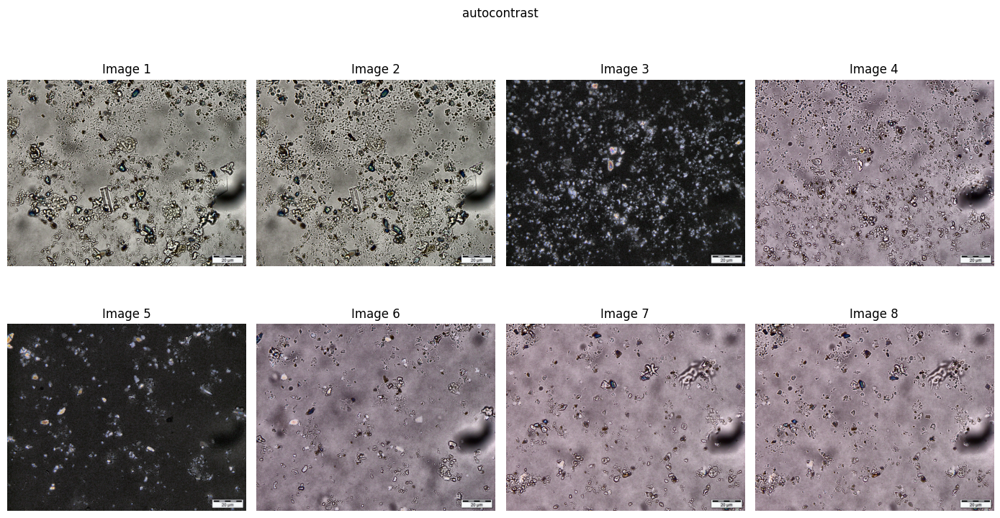

In [ ]:
show_images(ahe_var,"autocontrast")

In [ ]:
from PIL import Image
from numpy import asarray
output_AHE = "/content/gdrive/MyDrive/Nannofossils_Dataset(MASTER)/preprocessed_image/AHE/"
for i in range(227):
  image_AHE = ahe_var[i]
  numpydata = asarray(image_AHE)
  numpydata = numpydata.astype(np.uint8)
  image_AHE2 = cv2.cvtColor(numpydata, cv2.COLOR_BGR2RGB)
  cv2.imwrite(f"{output_AHE}image_AHE({str(i+1)}).jpg",image_AHE2)

#EVALUASI PNSR

<ipython-input-56-e0c6abebd41c>:6: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr = metrics.peak_signal_noise_ratio(original_image, enhanced_image)
<ipython-input-56-e0c6abebd41c>:7: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = metrics.structural_similarity(original_image, enhanced_image, multichannel=True)


Gambar 1: PSNR = 6.08, SSIM = -0.0031
Gambar 2: PSNR = 16.40, SSIM = 0.7937
Gambar 3: PSNR = 6.32, SSIM = 0.0224
Gambar 4: PSNR = 5.98, SSIM = 0.0159
Gambar 5: PSNR = 23.23, SSIM = 0.9261
Gambar 6: PSNR = 7.26, SSIM = 0.0905
Gambar 7: PSNR = 16.95, SSIM = 0.7881
Gambar 8: PSNR = 6.53, SSIM = -0.0170
Gambar 9: PSNR = 13.91, SSIM = 0.8800
Gambar 10: PSNR = 6.17, SSIM = 0.0033
Gambar 11: PSNR = 6.15, SSIM = -0.0397
Gambar 12: PSNR = 17.10, SSIM = 0.9312
Gambar 13: PSNR = 17.78, SSIM = 0.9244
Gambar 14: PSNR = 6.86, SSIM = -0.1038
Gambar 15: PSNR = 5.99, SSIM = -0.0114
Gambar 16: PSNR = 5.96, SSIM = -0.0151
Gambar 17: PSNR = 6.04, SSIM = 0.0046
Gambar 18: PSNR = 16.75, SSIM = 0.8238
Gambar 19: PSNR = 17.35, SSIM = 0.8604
Gambar 20: PSNR = 5.93, SSIM = 0.0151


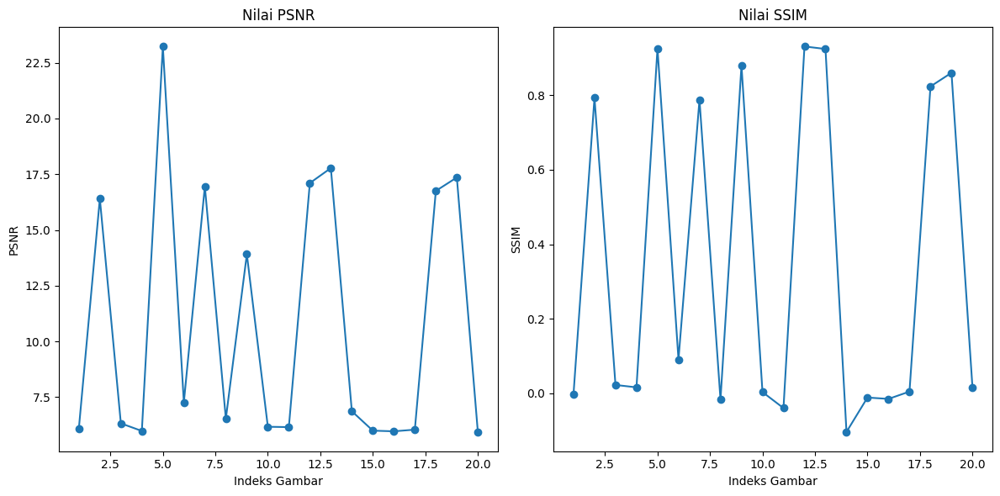

In [ ]:
from skimage import metrics
import matplotlib.pyplot as plt

# Fungsi untuk menghitung PSNR dan SSIM
def evaluate_images(original_image, enhanced_image):
    psnr = metrics.peak_signal_noise_ratio(original_image, enhanced_image)
    ssim = metrics.structural_similarity(original_image, enhanced_image, multichannel=True)
    return psnr, ssim

# Contoh daftar variabel gambar asli dan gambar yang telah diolah
# Ubah ini dengan daftar variabel gambar Anda sendiri
original_images = Hres_ori_rgb_var
enhanced_images = adaptiveInvertContrast_var

# Pastikan jumlah gambar asli dan gambar yang diolah sama
if len(original_images) != len(enhanced_images):
    raise ValueError("Jumlah gambar asli dan gambar yang diolah harus sama")

# Evaluasi PSNR dan SSIM untuk setiap pasangan gambar
psnr_values = []
ssim_values = []

for original_image, enhanced_image in zip(original_images, enhanced_images):
    psnr, ssim = evaluate_images(original_image, enhanced_image)
    psnr_values.append(psnr)
    ssim_values.append(ssim)

# Tampilkan hasil
for i, (psnr, ssim) in enumerate(zip(psnr_values, ssim_values)):
    print(f"Gambar {i+1}: PSNR = {psnr:.2f}, SSIM = {ssim:.4f}")

# Plot hasil
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title('Nilai PSNR')
plt.plot(range(1, len(psnr_values) + 1), psnr_values, marker='o')
plt.xlabel('Indeks Gambar')
plt.ylabel('PSNR')

plt.subplot(1, 2, 2)
plt.title('Nilai SSIM')
plt.plot(range(1, len(ssim_values) + 1), ssim_values, marker='o')
plt.xlabel('Indeks Gambar')
plt.ylabel('SSIM')

plt.tight_layout()
plt.show()